# Getting the data

Before run this notebook, it is necessary to download the archive file with the training images and respective annotation files.

Hit the download button and copy the archive(1).zip to the data folder. After that, run the next cell.

In [1]:

!pip install tensorflow
!pip install tensorflow_hub
!pip install Keras-Preprocessing
!pip install keras==2.15.0



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 1.9 MB/s eta 0:00:00


In [2]:
import random
import os
import time
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import plotly.express as px

import tensorflow as tf
from tensorflow import keras
import tensorflow_hub as hub

import keras_preprocessing
from keras_preprocessing import image
from keras_preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau

from keras import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.keras.optimizers import adam_v2
#adam_v2.Adam(learning_rate=0.0001, clipnorm=1.0, clipvalue=0.5)

from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers import Flatten, Dense, BatchNormalization, Activation,Dropout

from tensorflow.keras.utils import plot_model
from tensorflow.keras import Model

# Getting the images
Getting the images in training dataset


In [3]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')

'''
zip_ref = zipfile.ZipFile("/content/drive/My Drive/archive (2).zip", 'r')
zip_ref.extractall("/content/drive/My Drive/Data/clothings")
zip_ref.close()
'''

Mounted at /content/drive/


'\nzip_ref = zipfile.ZipFile("/content/drive/My Drive/archive (2).zip", \'r\')\nzip_ref.extractall("/content/drive/My Drive/Data/clothings")\nzip_ref.close()\n'

In [4]:
TRAINING_DIR = '/content/drive/My Drive/Data/clothings/images_compressed'
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
#Change epochs here
EPOCHS = 30
LEARNING_RATE = 0.001
print(f"There are {len(os.listdir(TRAINING_DIR))} images in training set");

There are 5762 images in training set


d4eea203-72d6-4f7a-a212-ed214c7567f0.jpg


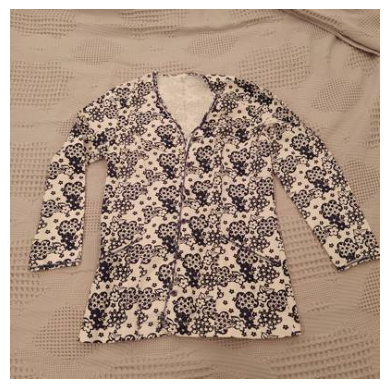

In [5]:
#Print out the dataset images to see whether it works

import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

file_names = os.listdir(TRAINING_DIR)
#file_names[:10]

sample_img_path = str(file_names[0])
print(sample_img_path)
sample_img = cv.imread('/content/drive/My Drive/Data/clothings/images_compressed/'+sample_img_path, cv.IMREAD_COLOR)
plt.imshow(cv.cvtColor(sample_img, cv.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

# Reading from excel
Reading the label from excel file and give the images a corressponding description to allow the model to identify

In [6]:
data = pd.read_csv('/content/drive/My Drive/Data/clothings/images.csv')
data.head()


,image,sender_id,label,kids
0,4285fab0-751a-4b74-8e9b-43af05deee22,124,Not sure,False
1,ea7b6656-3f84-4eb3-9099-23e623fc1018,148,T-Shirt,False
2,00627a3f-0477-401c-95eb-92642cbe078d,94,Not sure,False
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa,43,T-Shirt,False
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0,189,Shoes,False


In [7]:
data['image'] = data['image']+'.jpg'
data_1 = data[['image', 'label']]
data_1.head()

,image,label
0,4285fab0-751a-4b74-8e9b-43af05deee22.jpg,Not sure
1,ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg,T-Shirt
2,00627a3f-0477-401c-95eb-92642cbe078d.jpg,Not sure
3,ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg,T-Shirt
4,3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg,Shoes


In [8]:
data_1['image']

0       4285fab0-751a-4b74-8e9b-43af05deee22.jpg
1       ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg
2       00627a3f-0477-401c-95eb-92642cbe078d.jpg
3       ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg
4       3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg
                          ...                   
5398    dfd4079d-967b-4b3e-8574-fbac11b58103.jpg
5399    befa14be-8140-4faf-8061-1039947e329d.jpg
5400    5379356a-40ee-4890-b416-2336a7d84061.jpg
5401    65507fb8-3456-4c15-b53e-d1b03bf71a59.jpg
5402    32b99302-cec7-4dec-adfa-3d4029674209.jpg
Name: image, Length: 5403, dtype: object

In [9]:
#Getting all the corrupted file path images
'''
import PIL
from pathlib import Path
from PIL import UnidentifiedImageError

path = Path(TRAINING_DIR).rglob("*.jpg")
for img_p in path:
    try:
        img = PIL.Image.open(img_p)
    except PIL.UnidentifiedImageError:
            print(img_p)
'''

'\nimport PIL\nfrom pathlib import Path\nfrom PIL import UnidentifiedImageError\n\npath = Path(TRAINING_DIR).rglob("*.jpg")\nfor img_p in path:\n    try:\n        img = PIL.Image.open(img_p)\n    except PIL.UnidentifiedImageError:\n            print(img_p)\n'

In [10]:
#6 corrupted images found
corrupted = ['040d73b7-21b5-4cf2-84fc-e1a80231b202.jpg', '1d0129a1-f29a-4a3f-b103-f651176183eb.jpg', '784d67d4-b95e-4abb-baf7-8024f18dc3c8.jpg',
            'b72ed5cd-9f5f-49a7-b12e-63a078212a17.jpg', 'c60e486d-10ed-4f64-abab-5bb698c736dd.jpg', 'd028580f-9a98-4fb5-a6c9-5dc362ad3f09.jpg']

data_1 = data_1.drop(data_1[data_1['image'].isin(corrupted)].index, axis=0)
#There is a change in length
data_1['image']

0       4285fab0-751a-4b74-8e9b-43af05deee22.jpg
1       ea7b6656-3f84-4eb3-9099-23e623fc1018.jpg
2       00627a3f-0477-401c-95eb-92642cbe078d.jpg
3       ea2ffd4d-9b25-4ca8-9dc2-bd27f1cc59fa.jpg
4       3b86d877-2b9e-4c8b-a6a2-1d87513309d0.jpg
                          ...                   
5398    dfd4079d-967b-4b3e-8574-fbac11b58103.jpg
5399    befa14be-8140-4faf-8061-1039947e329d.jpg
5400    5379356a-40ee-4890-b416-2336a7d84061.jpg
5401    65507fb8-3456-4c15-b53e-d1b03bf71a59.jpg
5402    32b99302-cec7-4dec-adfa-3d4029674209.jpg
Name: image, Length: 5398, dtype: object

In [11]:
class_names = list(data_1['label'].unique())
print(len(class_names))
class_names

20


['Not sure',
 'T-Shirt',
 'Shoes',
 'Shorts',
 'Shirt',
 'Pants',
 'Skirt',
 'Other',
 'Top',
 'Outwear',
 'Dress',
 'Body',
 'Longsleeve',
 'Undershirt',
 'Hat',
 'Polo',
 'Blouse',
 'Hoodie',
 'Skip',
 'Blazer']

In [12]:
#Removing unrecognizable dataset

data_1 = data_1[~data_1['label'].isin(['Skip', 'Not sure', 'Other', 'Blouse'])]
class_names = list(data_1['label'].unique())
class_dict = dict(zip(class_names, range(len(class_names))))
class_dict

{'T-Shirt': 0,
 'Shoes': 1,
 'Shorts': 2,
 'Shirt': 3,
 'Pants': 4,
 'Skirt': 5,
 'Top': 6,
 'Outwear': 7,
 'Dress': 8,
 'Body': 9,
 'Longsleeve': 10,
 'Undershirt': 11,
 'Hat': 12,
 'Polo': 13,
 'Hoodie': 14,
 'Blazer': 15}

In [13]:
y_train = data_1['label']

In [14]:
def show_random_training_image():
    random_index = random.choice(data_1.index)
    img_path = data_1['image'][random_index]
    label = data_1['label'][random_index]
    complete_path = TRAINING_DIR + '/' + img_path
    image = mpimg.imread(complete_path)
    plt.imshow(image)
    plt.axis('off')
    plt.title(label)

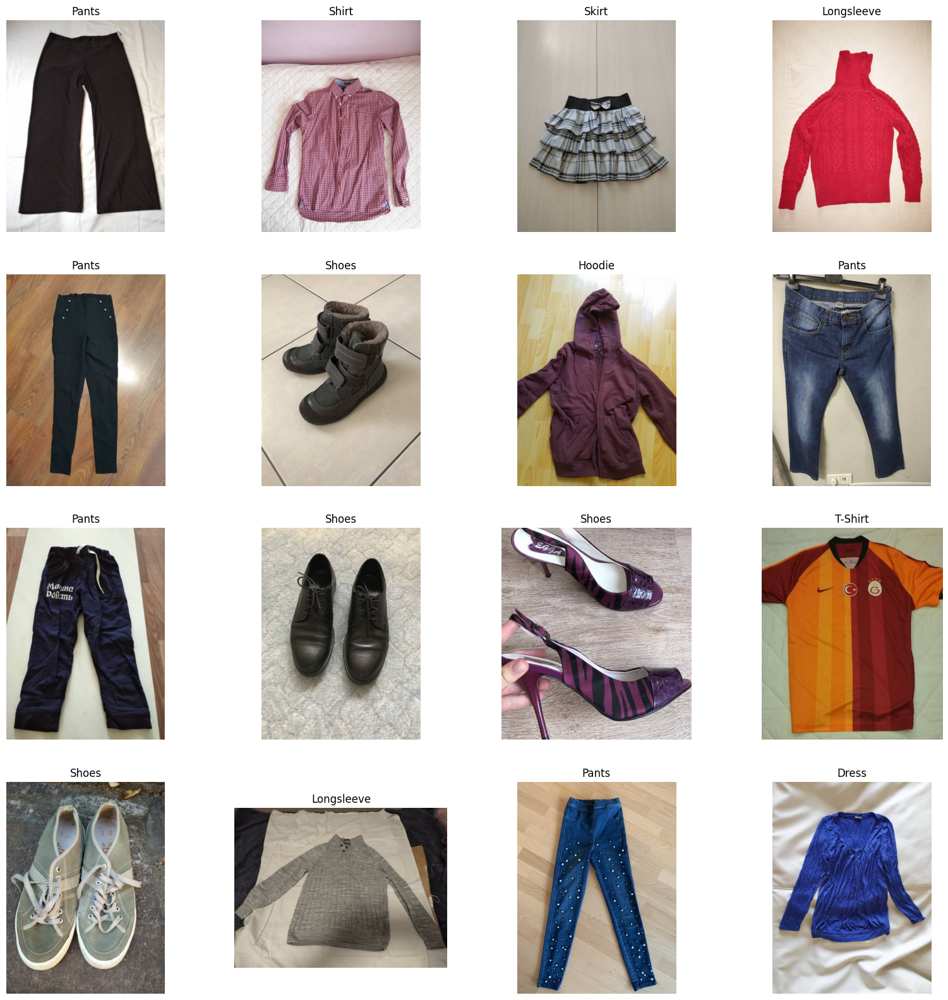

In [15]:
plt.figure(figsize=(20, 20))
for i in range(16):
    ax = plt.subplot(4, 4, i+1)
    show_random_training_image()

In [16]:
train_datagen = ImageDataGenerator(rescale=1./255,
                                  rotation_range=40,
                                  width_shift_range=0.3,
                                  height_shift_range=0.3,
                                  zoom_range=0.3,
                                  horizontal_flip=True,
                                  validation_split=0.1)

train_generator = train_datagen.flow_from_dataframe(
    dataframe=data_1,
    directory=TRAINING_DIR,
    x_col='image',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=True,
    subset='training'
)

validation_generator = train_datagen.flow_from_dataframe(
    dataframe=data_1,
    directory=TRAINING_DIR,
    x_col='image',
    y_col='label',
    target_size=IMAGE_SIZE,
    class_mode='categorical',
    batch_size=BATCH_SIZE,
    shuffle=False,
    subset='validation'
)

Found 4566 validated image filenames belonging to 16 classes.
Found 507 validated image filenames belonging to 16 classes.


In [17]:
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2

pre_trained_model = MobileNetV2(input_shape=(224, 224, 3),
                                include_top=False,
                                weights='imagenet')

for layer in pre_trained_model.layers:
    layer.trainable = True

#pre_trained_model.summary()

last_layer = pre_trained_model.get_layer('out_relu')
#print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

9406464/9406464 [==============================] - 1s 0us/step


In [18]:
x = Flatten()(last_output)
x = Dropout(0.3)(x)
x = Dense(256, activation='relu', kernel_regularizer='l2')(x)
x = Dropout(0.3)(x)
x = Dense(16, activation='softmax')(x)

model = Model(pre_trained_model.input, x)

In [19]:
learn_rate = LEARNING_RATE

es = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=10)
cb = ModelCheckpoint('mobilenetv2.keras',save_best_only=True)
lrr= ReduceLROnPlateau(monitor='val_accuracy', factor=.1, patience=5, min_lr=1e-5)

adam = adam_v2.Adam(learning_rate=learn_rate)
model.compile(loss='categorical_crossentropy',optimizer='adam', metrics=['accuracy'])


history = model.fit(train_generator, epochs=EPOCHS,
                    validation_data=validation_generator,
                    callbacks=[es, cb, lrr])

model = tf.keras.models.load_model('mobilenetv2.keras')

Epoch 1/30
143/143 [==============================] - 237s 726ms/step - loss: 6.7194 - accuracy: 0.2843 - val_loss: 64.5929 - val_accuracy: 0.1262 - lr: 0.0010
Epoch 2/30
143/143 [==============================] - 99s 694ms/step - loss: 3.4750 - accuracy: 0.3594 - val_loss: 13.3651 - val_accuracy: 0.1302 - lr: 0.0010
Epoch 3/30
143/143 [==============================] - 98s 687ms/step - loss: 2.6549 - accuracy: 0.3887 - val_loss: 5.5291 - val_accuracy: 0.2209 - lr: 0.0010
Epoch 4/30
143/143 [==============================] - 97s 677ms/step - loss: 2.6319 - accuracy: 0.4157 - val_loss: 19.2895 - val_accuracy: 0.0848 - lr: 0.0010
Epoch 5/30
143/143 [==============================] - 96s 673ms/step - loss: 2.5054 - accuracy: 0.4512 - val_loss: 5.8914 - val_accuracy: 0.0966 - lr: 0.0010
Epoch 6/30
143/143 [==============================] - 94s 659ms/step - loss: 2.3635 - accuracy: 0.4936 - val_loss: 7.3465 - val_accuracy: 0.1045 - lr: 0.0010
Epoch 7/30
143/143 [============================

In [20]:
loss, accuracy = model.evaluate(validation_generator, verbose=0)
print(f"Model Loss is {loss:.2f} and Accuracy is {100*np.round(accuracy, 4)}%")

Model Loss is 1.11 and Accuracy is 72.19%


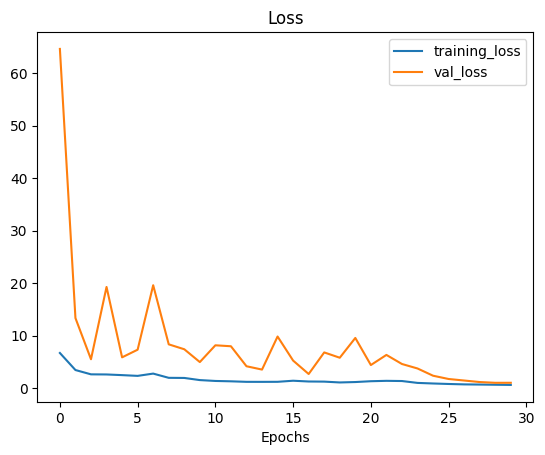

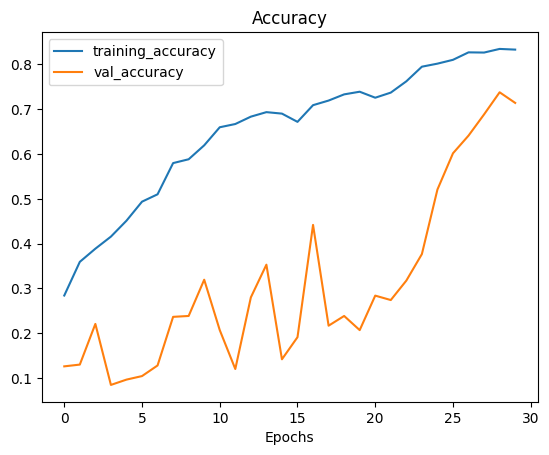

In [21]:
def plot_loss_curves(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))

    # Plot loss
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.figure()
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.legend()

plot_loss_curves(history)

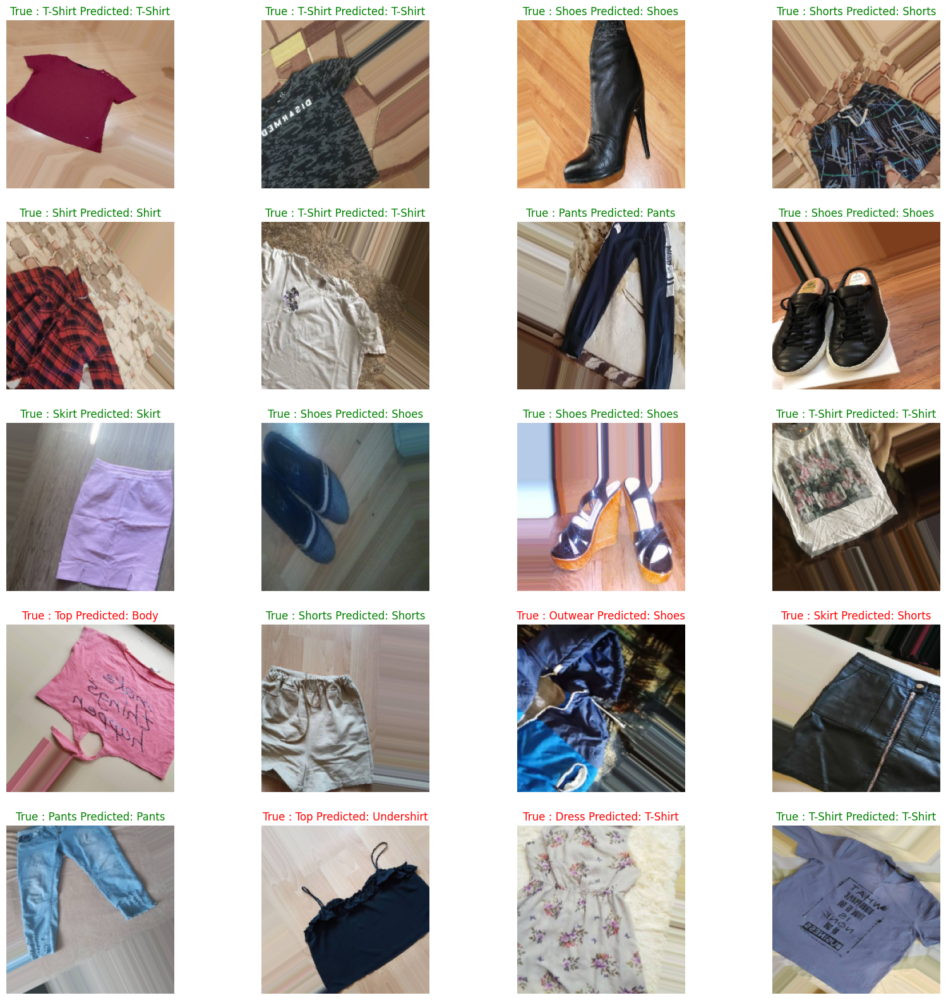

In [22]:
#Prediction on validation Images
classes = list(train_generator.class_indices.keys())
def predict_val_image(index):
    predictions =  model.predict(val_images, verbose=0)[index]
    true_label = classes[val_labels[index].argmax()]
    predicted_label = classes[predictions.argmax()]

    if(true_label== predicted_label):
        color = 'green'
    else:
        color = 'red'

    plt.title(f"True : {true_label} Predicted: {predicted_label}", color=color)
    plt.imshow(val_images[index])
    plt.axis('off')

val_images, val_labels = validation_generator.next()
plt.figure(figsize=(20, 20))
for i in range(20):
    ax = plt.subplot(5, 4, i + 1)
    predict_val_image(i)


In [23]:
#Predictions on Unseen Images
custom_dir = '/content/drive/My Drive/Data/clothings/images_original'
custom_paths = []
for image in os.listdir(custom_dir):
        custom_paths.append(custom_dir+'/'+image)

def predict_random_image():
    path = random.choice(custom_paths)
    image = tf.keras.preprocessing.image.load_img(path, target_size=(224, 224))
    input_arr = tf.keras.preprocessing.image.img_to_array(image)
    input_arr = np.array([input_arr])
    input_arr = input_arr.astype('float32') / 255.
    predictions = model.predict(input_arr, verbose=0)
    series = pd.Series(predictions[0], index=classes)
    predicted_classes = np.argsort(predictions)
    predictions.sort()
    plt.title(f"{classes[predicted_classes[0][-1]]} - {round(predictions[0][-1] * 100,2)}% \n{classes[predicted_classes[0][-2]]} - {round(predictions[0][-2] * 100,2)}% \n{classes[predicted_classes[0][-3]]} - {round(predictions[0][-2] * 100,3)}%")
    plt.imshow(image)
    plt.axis('off')


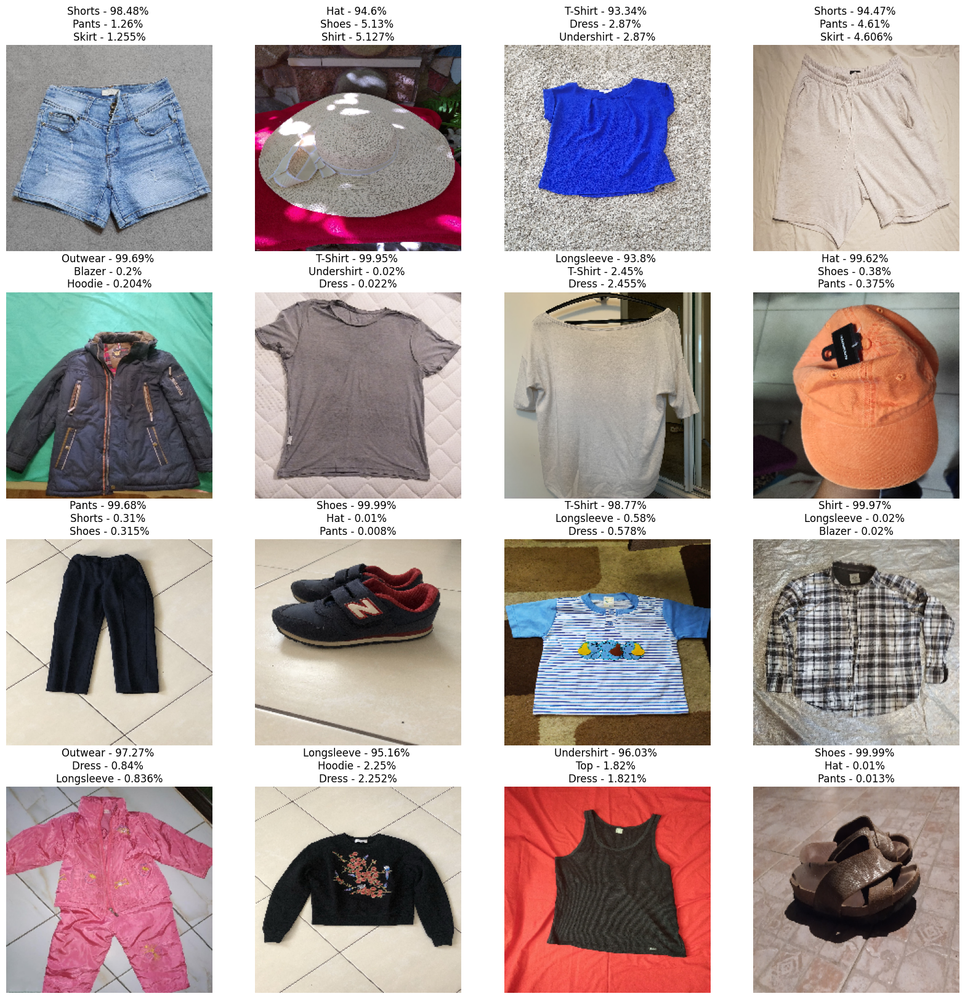

In [24]:
plt.figure(figsize=(20, 20))
for i in range(16):
    ax = plt.subplot(4, 4, i + 1)
    predict_random_image()